In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
from PIL import Image as PImage
import cv2 as cv
from os import listdir
import glob
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import csv
from sklearn.model_selection import train_test_split
import os
import random
import pandas as pd
import numpy as np
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import applications
from tensorflow.keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D,GlobalAveragePooling2D, GlobalMaxPooling2D, Dropout
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.utils import  plot_model
from tensorflow.keras.utils import get_file
from tensorflow.keras.utils import model_to_dot
from tensorflow.keras.applications.imagenet_utils import preprocess_input
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array
from matplotlib import pyplot as plt

In [4]:
#tạo shortcut cho datapath
path0 = "/content/drive/MyDrive/DataAI_t/"
path1 = "/content/drive/MyDrive/DataAI_t/Compass/"
path2 = "/content/drive/MyDrive/DataAI_t/Human/"
path3 = "/content/drive/MyDrive/DataAI_t/Lion/"
path4 = "/content/drive/MyDrive/DataAI_t/Sun/"

In [5]:
#Bắt đầu gán nhãn và ghi vào file Data.csv 
Column1 = 'ID'
Column2 = 'Name'
Column3 = 'Class'

path = []               # mảng chứa path của các lớp dữ liệu
path.append(path1)      # path[0] = path1
path.append(path2)
path.append(path3)
path.append(path4)


ID = []             # mảng chứa số tt
Name = []           # mảng chưa tên ảnh
Class = []          # mảng chứa phân loại lớp
count = 0
with open("/content/drive/MyDrive/DataAI_t/Data.csv", "a") as file:
    writer = csv.writer(file)
    writer.writerow([Column1, Column2, Column3])
for datapath1 in path:
  attemp = count
  imagesList = listdir(datapath1)
  for img in imagesList:
    ID.append(count)
    count+=1
    Name.append(img)
    if datapath1 == path1:
      Class.append('Compass')
    elif datapath1 == path2:
      Class.append('Human')
    elif datapath1 == path3:
      Class.append('Lion')
    elif datapath1 == path4:
      Class.append('Sun')
  with open("/content/drive/MyDrive/DataAI_t/Data.csv", "a") as file:
    writer = csv.writer(file)
    # writer.writerow([Column1, Column2, Column3])
    for i in range(attemp,count):
      writer.writerow([ID[i], Name[i], Class[i]])


In [6]:
#Lấy nhãn 
ld = pd.read_csv('/content/drive/MyDrive/DataAI_t/Data.csv', names = ['ID','Name','Class'])
ld['Class'].value_counts()
ds = ld['Class'].unique() 
dataset_path ='/content/drive/MyDrive/DataAI_t'
dataset_path_test = '/content/drive/MyDrive/dataML_t'
# print(ds)

In [7]:
#khởi tạo 2 hàm

#hàm mã hóa nhãn
def labelDecoder(labels):
    result=[]
    for label in labels:
        if label == 'Sun': i = 0
        if label == 'Lion': i = 1
        if label == 'Human': i = 2
        if label == 'Compass': i = 3
        result.append(i)
    return np.array(result)

# hàm load dữ liệu
    
def load(image_paths, verbose=-1):
# Initialize the list of images and labels
    data = []
    labels = []
# Loop over input paths to read the data
# Load images
# Assuming path in following format:
# /path/to/dataset/{class}/{image-name}.jpg
    for (i, path) in enumerate(image_paths):
        image = cv.imread(path)
        # print(path)
        # print(image)
        # print(path)
        label = path.split(os.path.sep)[-2]       # lấy phần tử thứ 2 từ phải qua của path
# Resize image
# Push into data list 
        image = cv.resize(image, (224, 224))
        data.append(image)
# Encode labels as intergers
        labels.append(label)
# Show update
        if verbose > 0 and i > 0 and (i + 1) % verbose == 0:
           print("[INFO] processed {}/{}".format(i + 1, len(image_paths)))# Return a tuple of data and labels
    return (np.array(data), np.array(labels))


In [8]:
# thu tập datapath của tất cả các ảnh vào trộn lên

imagePaths = []
ds = np.delete(ds,0)
# ds = np.delete(ds,2)
print(ds)
for diag in ds:     #diag = 'lion', 'compass', 'human', 'sun'
    # print(diag)
    # dataset_path ='/content/drive/MyDrive/DataAI'
    paths = [os.path.join(dataset_path, diag, s) for s in os.listdir(path = os.path.join(dataset_path,diag)) if '.jpg' in s] 
    # paths = /content/drive/MyDrive/DataAI/Lion/Lion_0.jpg
    imagePaths.extend(paths)
print(len(imagePaths))
    # print('\n')
random.seed(42)
random.shuffle(imagePaths)

['Compass' 'Human' 'Lion' 'Sun']
4255


In [11]:
# initialize the shape of image,
# initialize the number of epochs to train for,
num_classes = 4
# and batch size
BatchSize = 64        #độ lớn đầu vào
Epochs = 25           #tách dữ liệu thành 25 phần
# initialize the data and labels
print("[INFO] loading images...")
(data, labels) = load(imagePaths, verbose=100)
labels = labelDecoder(labels)
# print(labels, data)

[INFO] loading images...
[INFO] processed 100/4255
[INFO] processed 200/4255
[INFO] processed 300/4255
[INFO] processed 400/4255
[INFO] processed 500/4255
[INFO] processed 600/4255
[INFO] processed 700/4255
[INFO] processed 800/4255
[INFO] processed 900/4255
[INFO] processed 1000/4255
[INFO] processed 1100/4255
[INFO] processed 1200/4255
[INFO] processed 1300/4255
[INFO] processed 1400/4255
[INFO] processed 1500/4255
[INFO] processed 1600/4255
[INFO] processed 1700/4255
[INFO] processed 1800/4255
[INFO] processed 1900/4255
[INFO] processed 2000/4255
[INFO] processed 2100/4255
[INFO] processed 2200/4255
[INFO] processed 2300/4255
[INFO] processed 2400/4255
[INFO] processed 2500/4255
[INFO] processed 2600/4255
[INFO] processed 2700/4255
[INFO] processed 2800/4255
[INFO] processed 2900/4255
[INFO] processed 3000/4255
[INFO] processed 3100/4255
[INFO] processed 3200/4255
[INFO] processed 3300/4255
[INFO] processed 3400/4255
[INFO] processed 3500/4255
[INFO] processed 3600/4255
[INFO] proce

In [12]:
# Show memory consumption
print("[INFO] features matrix: {:.1f}MB".format(data.nbytes / (1024 * 1024.0)))
# Partition the data.
# training: 75%, testing: 25%
#data = np.array(data,dtype='int')
(trainX, testX, trainY, testY) = train_test_split(data, labels, test_size= 0.25, random_state=42)
trainY = to_categorical(trainY, num_classes)
testY = to_categorical(testY, num_classes)
trainX=trainX.astype('float32')
testX=testX.astype('float32')
print ("number of training examples = " + str(trainX.shape[0]))
print ("number of test examples = " + str(testX.shape[0]))
print ("X_train shape: " + str(trainX.shape))
print ("Y_train shape: " + str(trainY.shape))
print ("X_test shape: " + str(testX.shape))
print ("Y_test shape: " + str(testY.shape))

[INFO] features matrix: 610.8MB
number of training examples = 3191
number of test examples = 1064
X_train shape: (3191, 224, 224, 3)
Y_train shape: (3191, 4)
X_test shape: (1064, 224, 224, 3)
Y_test shape: (1064, 4)


58900480/58889256 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

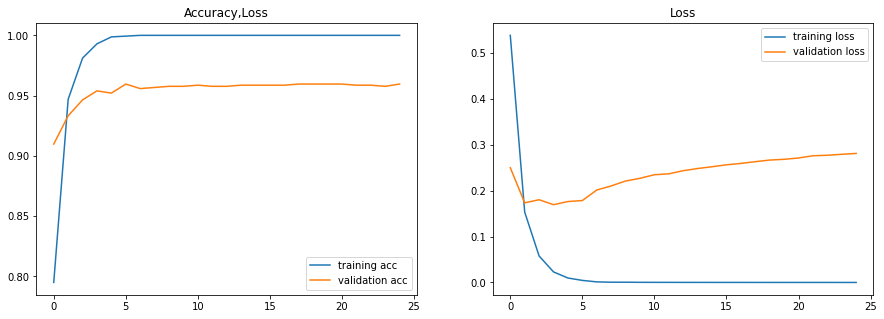

In [13]:
#chạy model

"""vgg16"""
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization
from keras.models import Sequential
from sklearn.metrics import f1_score
IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS = 224, 224, 3
IMAGE_SHAPE = (IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS) 

Vgg16_model = applications.vgg16.VGG16(input_shape=IMAGE_SHAPE,include_top = False, weights= 'imagenet')
x = Vgg16_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(4069,activation ='relu')(x)
x = Dense(4069,activation = 'relu')(x)
predictions = Dense(4, activation='softmax')(x)
model = Model(inputs = Vgg16_model.input, outputs = predictions)
adam = Adam(learning_rate=0.00001)
model.compile(optimizer= adam, loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

H=model.fit(trainX, trainY, batch_size=BatchSize, epochs=Epochs, verbose=1, validation_data=(testX, testY),steps_per_epoch=len(trainX)//BatchSize)

#plot đô thị
plt.figure(figsize = (15,5))
plt.subplot(1,2,1)
plt.title('Accuracy,Loss')
plt.plot(H.history['accuracy'], label = 'training acc')
plt.plot(H.history['val_accuracy'], label = 'validation acc')
plt.legend()
plt.subplot(1,2,2)
plt.plot(H.history['loss'], label = 'training loss')
plt.plot(H.history['val_loss'], label = 'validation loss')
plt.legend()
plt.title('Loss')
plt.savefig('plot.png', bbox_inches="tight")

#in kết quả sau khi chạy
# print loss and test accuracy
preds = model.evaluate(testX, testY)
print ("Loss = " + str(preds[0]))
print ("Test Accuracy = " + str(preds[1]))

In [14]:
#Modify để có thể chỉ lấy kết quả output tại lớp GlobalAveragePooling2D thông qua summary()
from tensorflow.keras.models import Model

feature_layer = model.layers[-4].output
extractor = Model(inputs = Vgg16_model.input, outputs = feature_layer)
extractor.summary()
# print(extractor.summary())

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [15]:
#hàm trích xuất vector đặc chưng
def feature_vt(img_path):
   img = image.load_img(img_path, target_size=(224,224))
   x = image.img_to_array(img)
   x = np.expand_dims(x, axis = 0)
   feature = extractor.predict(x)
      # print(feature.shape)
   value = np.asarray(feature).reshape((feature.shape[1], feature.shape[0])) #reshape lại feature thành 1 ma trận có 512 hàng và 1 cột feature.shape[1] 
      # = 512 và feature.shpe[0] = 1 --> tạo ra mảng (512, 1) 
      # print(value)
   value = value.flatten()
   return value

In [16]:
#trích xuất vector đặc trưng cho tập data
import csv
# path_to_csv = '/content/drive/MyDrive/dataML_up/feature_train.csv'   #file cho hình ảnh ko text
path_to_csv = '/content/drive/MyDrive/DataAI_t/feature_train.csv'

with open(path_to_csv, 'w') as csvfile:
    writer = csv.writer(csvfile)
    header = 'Labels'
    data = [header]
    for i in range(512):
      feature_n = 'feature' +str(i)
      data.append(feature_n)
    writer.writerow(data)
    for i in range(len(imagePaths)):
      data = [labels[i]]
      # print(imagePaths[i])
      img = image.load_img(imagePaths[i], target_size=(224,224))
      x = image.img_to_array(img)
      # x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
      x = np.expand_dims(x, axis = 0)
      feature = extractor.predict(x)
      value = np.asarray(feature).reshape((feature.shape[1], feature.shape[0])) #reshape lại feature thành 1 ma trận có 512 hàng và 1 cột feature.shape[1] 
      # = 512 và feature.shpe[0] = 1 --> tạo ra mảng (512, 1) 
      # print(value)
      value = value.flatten()
      # print(value)
      data.extend(value)
      # print(data)
      writer.writerow(data)

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [17]:
#khởi tạo hàm tính khoảng cách Euclidean
# import numpy as np
# np.random.seed(1234)
from math import sqrt
 
# calculate euclidean distance
def euclidean_distance(a, b):
	return sqrt(sum((e1-e2)**2 for e1, e2 in zip(a,b)))


In [18]:
#code cho 1 tệp test
j = 0
path_csv = []          # mảng chưa link cho file csv
Arr_total = []         # mảng chứa tất cả input nơi chưa các đặc trưng
input = []             # mảng chứa địa chỉ đầu vào
 #Lấy các giá trị vector đặc trưng của tập dữ liệu
# df_test = pd.read_csv('/content/drive/MyDrive/dataML_up/feature_train.csv')
df_test = pd.read_csv('/content/drive/MyDrive/DataAI_t/feature_train.csv')
Arr = np.asarray(df_test.iloc[:,1:513])
Label_arr = np.asanyarray(df_test.iloc[:,0])
for s in os.listdir(path = os.path.join(dataset_path_test,'sun_test')):  # lấy ảnh test 
    if '.jpg' in s:
     paths = os.path.join(dataset_path_test, 'sun_test', s)
    # img_test = '/content/drive/MyDrive/dataML_t/hm2.jpg'    #input
    path_to_csv = '/content/drive/MyDrive/test_MLtext/distance_compass' + str(j) +  '.csv'    #File lưu khoảng cách tính được
    path_csv.append(path_to_csv)
    #Lấy giá trị vector đặc trưng input
    value_feature = feature_vt(paths)    
    input.append(paths)
    Arr_dis = []   #mảng chứa dist   # chứa dữ liệu cho 1 input
    with open(path_to_csv, 'w') as csvfile:
        writer = csv.writer(csvfile)
        for i in range(len(imagePaths)):
          tempt = [i]
          tempt.append(Label_arr[i])
          dist = euclidean_distance(value_feature, Arr[i])
          tempt.append(dist)
          writer.writerow(tempt)
          Arr_dis.append(tempt)            
    Arr_total.append(Arr_dis)    #mảng chưa dữ liệu cho các input
    j = j + 1

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [19]:
# code for displaying multiple images in one figure

#import libraries
import cv2
# from matplotlib import pyplot as plt
import matplotlib.image as mpimg

#hàm in ảnh
def showimg(input, path_img, Arr_dis):
    # create figure
    fig = plt.figure(figsize=(25, 10))

    # setting values to rows and column variables
    rows = 3
    columns = 9

    # reading images
    # ImageInput = cv2.imread(input)
    ImageInput = mpimg.imread(input)

    Image = []
    for i in range(26):
      img = mpimg.imread(path_img[i])
      Image.append(img)

    # Adds a subplot at the input position
    fig.add_subplot(rows, columns, 1)

    # showing image
    plt.imshow(ImageInput)
    # plt.axis('off')
    plt.title('0')
    string = str(input)
    plt.xlabel('Input')

    for i in range(26):
      fig.add_subplot(rows, columns, i + 2)

      # showing image
      plt.imshow(Image[i])
      # plt.axis('off')
      plt.title(Arr_dis[i])
      string = str(path_img[i])
      plt.xlabel(string.split('/')[6])


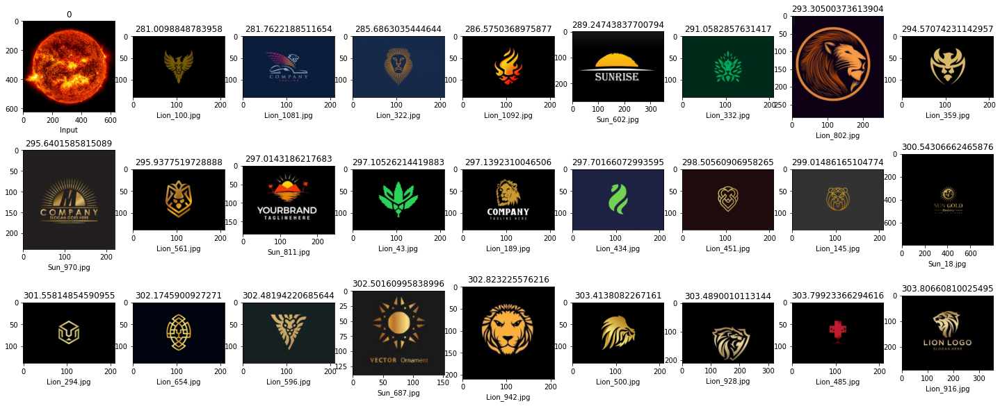

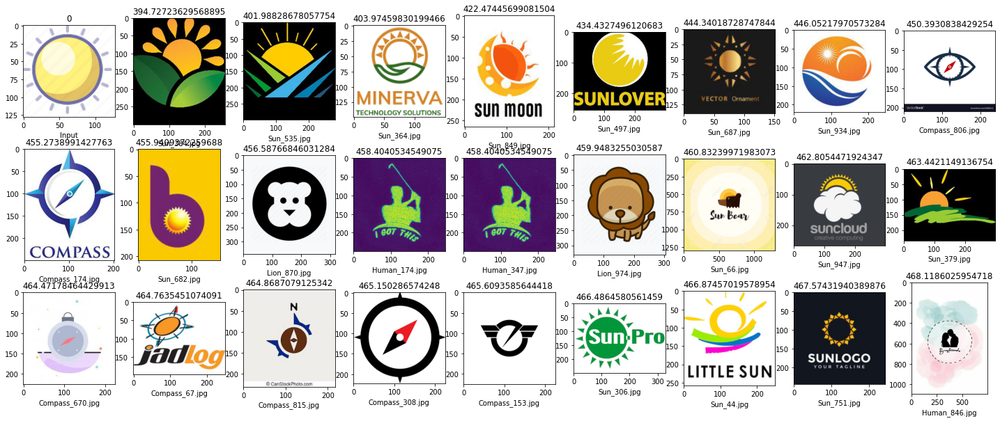

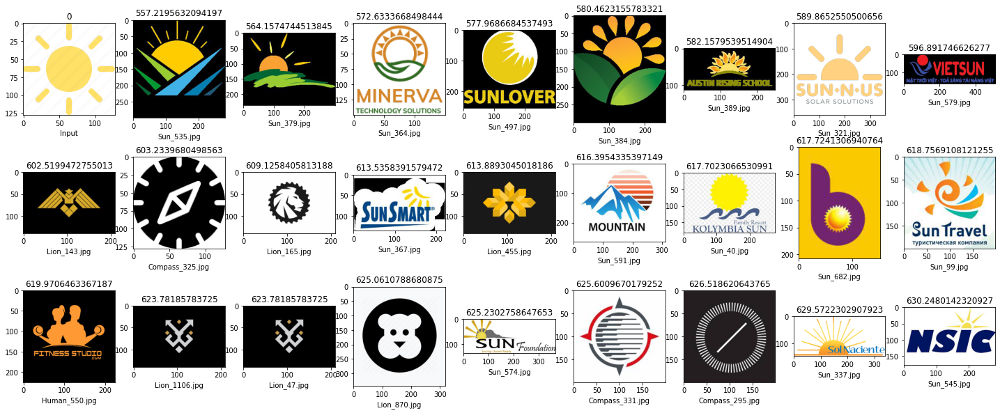

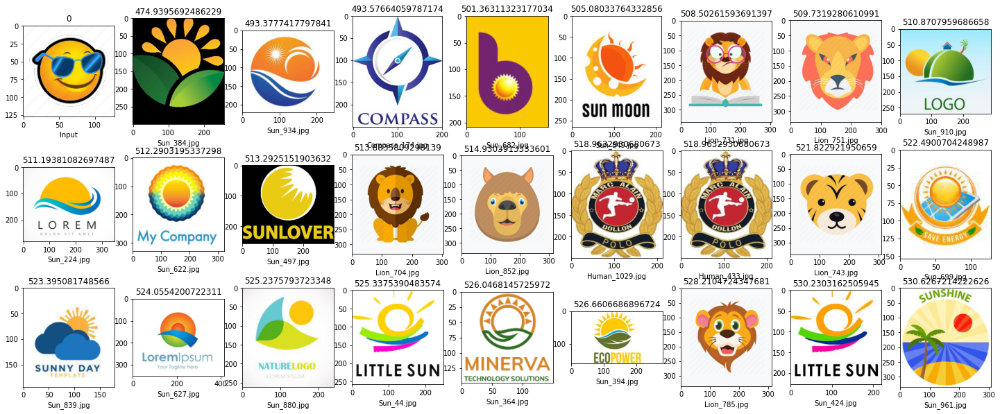

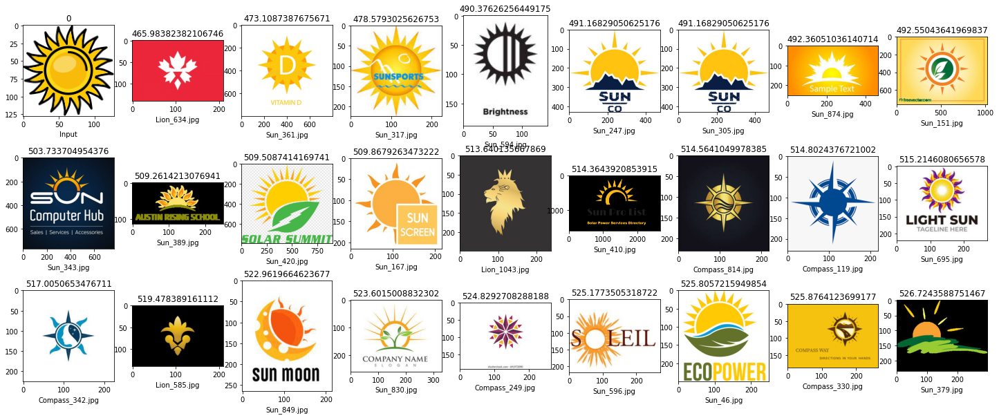

...

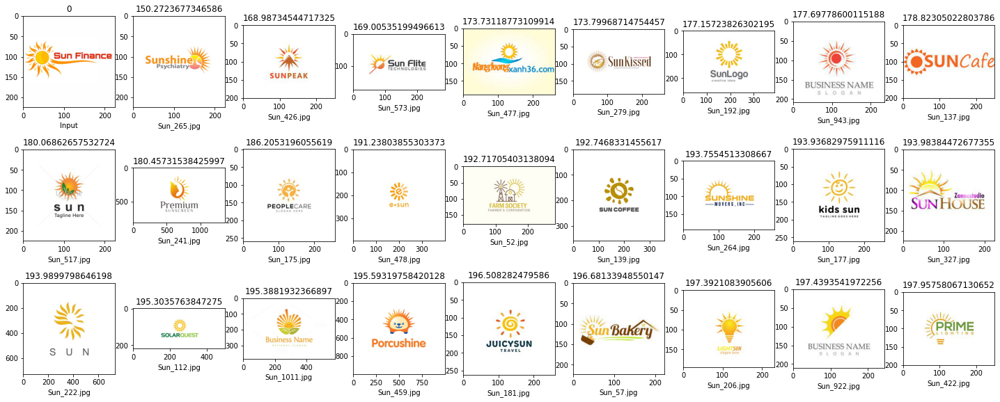

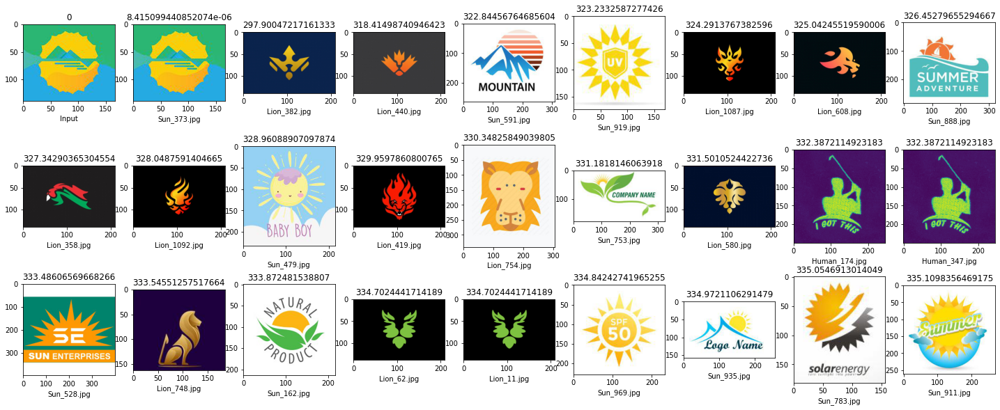

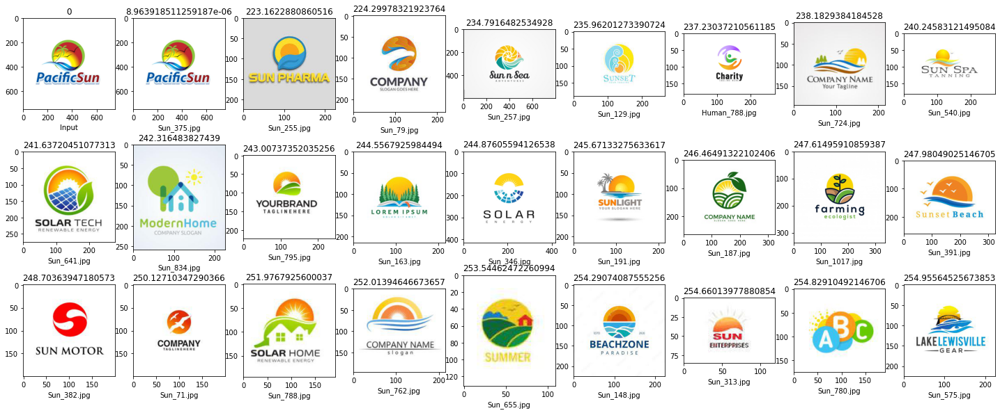

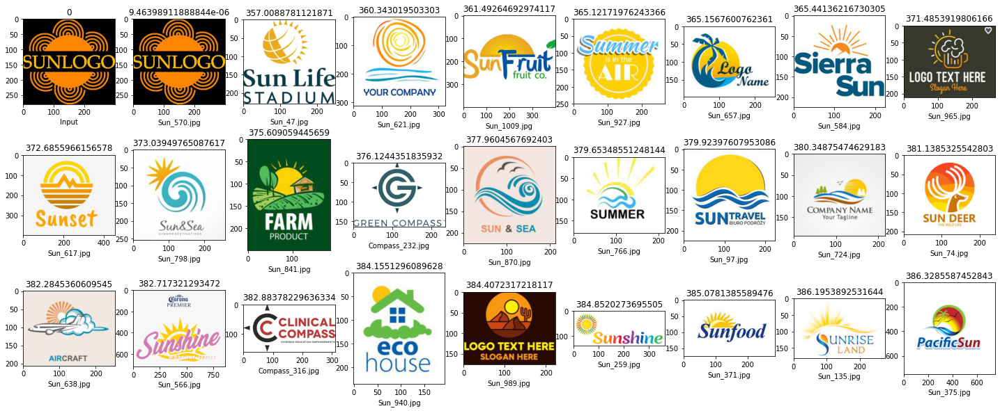

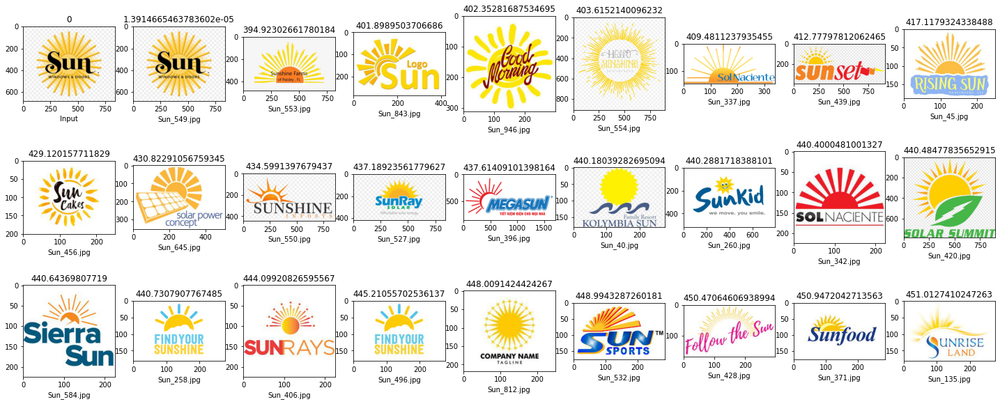

In [20]:
#@title Default title text
#Làm cho 1 chuỗi test
from IPython.display import Image
import matplotlib.image as mpimg

for i in range(len(Arr_total)):
  Arr_dis = np.array(Arr_total[i])
  sorted_array = Arr_dis[Arr_dis[:,2].argsort()]
  path_img = []
  arr_dis = []


  for j in range(26):
    arr_dis.append(sorted_array[j][2])
  for j in range(26):
    path_img.append(imagePaths[int(sorted_array[j][0])])
  showimg(input[i], path_img, arr_dis)

  